<a href="https://colab.research.google.com/github/alejopijuan/PromptInspirator/blob/main/Fastai%20Diffusion%20test1%20tardigrade.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from diffusers import StableDiffusionPipeline
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16, use_auth_token=True).to("cuda")
image = pipe("An astronaught scuba diving").images[0]

NameError: ignored

In [ ]:
!pip install transformers diffusers torch tqdm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install diffusers torch tqdm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install accelerate

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 175 kB 5.1 MB/s 


In [ ]:
from diffusers import StableDiffusionPipeline
import torch
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16, use_auth_token=True).to("cuda")
image = pipe("An astronaught scuba diving").images[0]


Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


OSError: ignored

Try 2

In [ ]:
!pip install -q --upgrade transformers diffusers ftfy

In [ ]:
from huggingface_hub import notebook_login
notebook_login()


In [ ]:
import torch
from transformers import CLIPTextModel, CLIPTokenizer
from transformers import logging
from diffusers import AutoencoderKL, UNet2DConditionModel, LMSDiscreteScheduler
from tqdm.auto import tqdm
from tqdm.auto import tqdm
from torch import autocast
from PIL import Image
from matplotlib import pyplot as plt
import numpy
from torchvision import transforms as tfms

# For video display:
from IPython.display import HTML
from base64 import b64encode

In [ ]:
# Supress some unnecessary warnings when loading the CLIPTextModel
logging.set_verbosity_error()

# Set device
torch_device = "cuda" if torch.cuda.is_available() else "cpu"

In [ ]:
torch_device

'cuda'

In [ ]:
!pip install accelerate

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Load the autoencoder model which will be used to decode the latents into image space. 
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae")


In [ ]:
# Load the tokenizer and text encoder to tokenize and encode the text. 
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14")



In [ ]:
# The UNet model for generating the latents.
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet")



Downloading:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/743 [00:00<?, ?B/s]

In [ ]:
# The noise scheduler
scheduler = LMSDiscreteScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", num_train_timesteps=1000)



In [ ]:
# To the GPU we go!
vae = vae.to(torch_device)
text_encoder = text_encoder.to(torch_device)
unet = unet.to(torch_device);

0it [00:00, ?it/s]

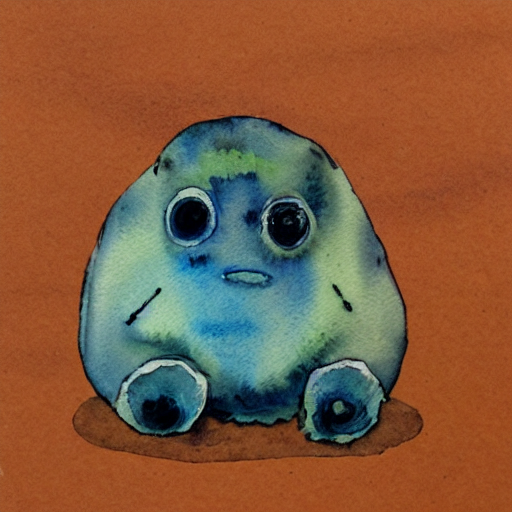

In [ ]:
# Some settings
prompt = ["A watercolor painting of a cute tardigrade"]
height = 512                        # default height of Stable Diffusion
width = 512                         # default width of Stable Diffusion
num_inference_steps = 50            # Number of denoising steps
guidance_scale = 7.5                # Scale for classifier-free guidance
generator = torch.manual_seed(32)   # Seed generator to create the inital latent noise
batch_size = 1

# Prep text 
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer(
    [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
)
with torch.no_grad():
    uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0] 
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

# Prep Scheduler
scheduler.set_timesteps(num_inference_steps)
# Prep latents
latents = torch.randn(
  (batch_size, unet.in_channels, height // 8, width // 8),
  generator=generator,
)
latents = latents.to(torch_device)
latents = latents * scheduler.init_noise_sigma # Scaling (previous versions did latents = latents * self.scheduler.sigmas[0]

# Loop
with autocast("cuda"):
    for i, t in tqdm(enumerate(scheduler.timesteps)):
        # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
        latent_model_input = torch.cat([latents] * 2)
        sigma = scheduler.sigmas[i]
        # Scale the latents (preconditioning):
        # latent_model_input = latent_model_input / ((sigma**2 + 1) ** 0.5) # Diffusers 0.3 and below
        latent_model_input = scheduler.scale_model_input(latent_model_input, t)

        # predict the noise residual
        with torch.no_grad():
            noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

        # perform guidance
        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

        # compute the previous noisy sample x_t -> x_t-1
        # latents = scheduler.step(noise_pred, i, latents)["prev_sample"] # Diffusers 0.3 and below
        latents = scheduler.step(noise_pred, t, latents).prev_sample

# scale and decode the image latents with vae
latents = 1 / 0.18215 * latents
with torch.no_grad():
    image = vae.decode(latents).sample

# Display
image = (image / 2 + 0.5).clamp(0, 1)
image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
images = (image * 255).round().astype("uint8")
pil_images = [Image.fromarray(image) for image in images]
pil_images[0]

In [ ]:
def prompt_inspirator(prompt = ["A watercolor painting of a cute tardigrade"]):
      # Some settings
  #prompt = ["A watercolor painting of a cute tardigrade"]
  height = 512                        # default height of Stable Diffusion
  width = 512                         # default width of Stable Diffusion
  num_inference_steps = 50            # Number of denoising steps
  guidance_scale = 7.5                # Scale for classifier-free guidance
  generator = torch.manual_seed(32)   # Seed generator to create the inital latent noise
  batch_size = 1

  # Prep text 
  text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
  with torch.no_grad():
      text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]
  max_length = text_input.input_ids.shape[-1]
  uncond_input = tokenizer(
      [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
  )
  with torch.no_grad():
      uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0] 
  text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

  # Prep Scheduler
  scheduler.set_timesteps(num_inference_steps)
  # Prep latents
  latents = torch.randn(
    (batch_size, unet.in_channels, height // 8, width // 8),
    generator=generator,
  )
  latents = latents.to(torch_device)
  latents = latents * scheduler.init_noise_sigma # Scaling (previous versions did latents = latents * self.scheduler.sigmas[0]

  # Loop
  with autocast("cuda"):
      for i, t in tqdm(enumerate(scheduler.timesteps)):
          # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
          latent_model_input = torch.cat([latents] * 2)
          sigma = scheduler.sigmas[i]
          # Scale the latents (preconditioning):
          # latent_model_input = latent_model_input / ((sigma**2 + 1) ** 0.5) # Diffusers 0.3 and below
          latent_model_input = scheduler.scale_model_input(latent_model_input, t)

          # predict the noise residual
          with torch.no_grad():
              noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

          # perform guidance
          noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
          noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

          # compute the previous noisy sample x_t -> x_t-1
          # latents = scheduler.step(noise_pred, i, latents)["prev_sample"] # Diffusers 0.3 and below
          latents = scheduler.step(noise_pred, t, latents).prev_sample

  # scale and decode the image latents with vae
  latents = 1 / 0.18215 * latents
  with torch.no_grad():
      image = vae.decode(latents).sample

  # Display
  image = (image / 2 + 0.5).clamp(0, 1)
  image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
  images = (image * 255).round().astype("uint8")
  pil_images = [Image.fromarray(image) for image in images]
  return pil_images[0]

0it [00:00, ?it/s]

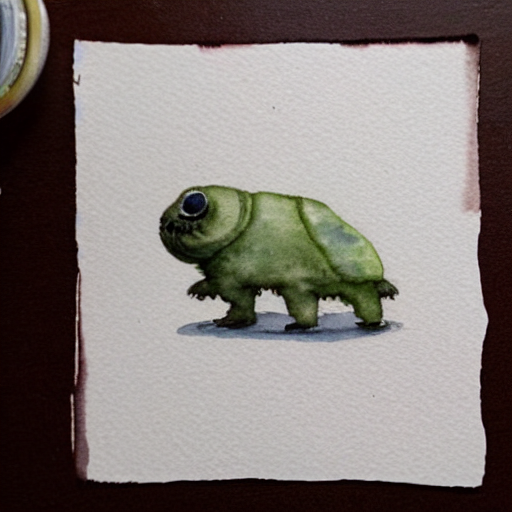

In [ ]:
#seed=0
prompt_inspirator(["A watercolor painting of a cute tardigrade"])

0it [00:00, ?it/s]

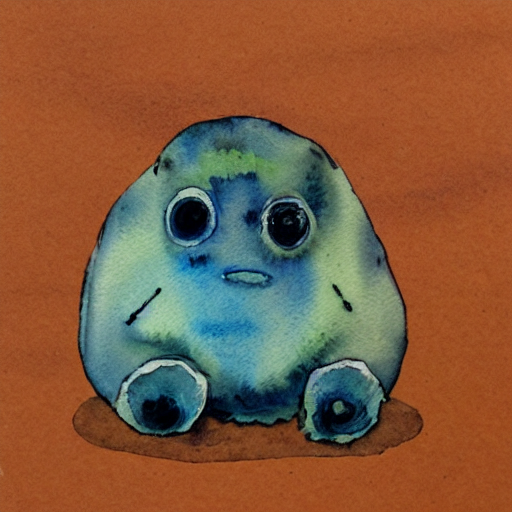

In [ ]:
#seed=32
prompt_inspirator(["A watercolor painting of a cute tardigrade"])

0it [00:00, ?it/s]

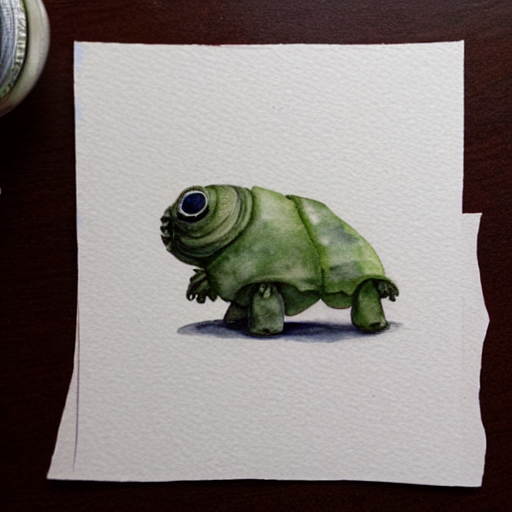

In [ ]:
#seed=0
prompt_inspirator(["a cute tardigrade, watercolor painting"])

0it [00:00, ?it/s]

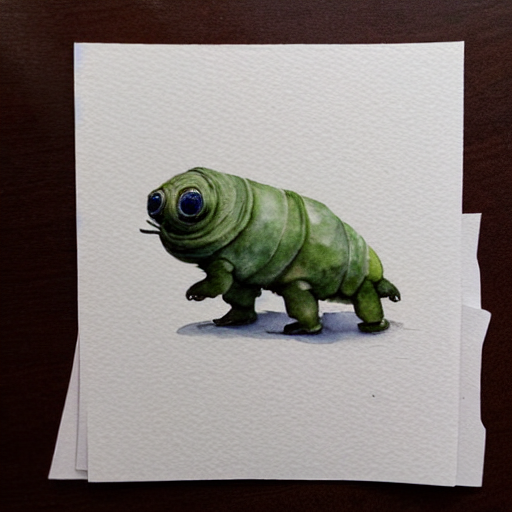

In [ ]:
prompt_inspirator(["a tardigrade, watercolor painting"])

0it [00:00, ?it/s]

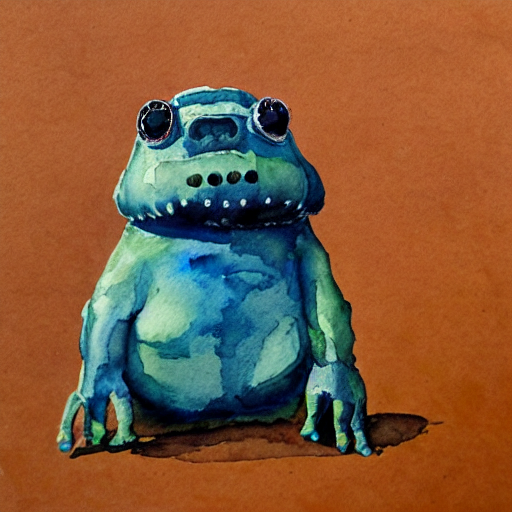

In [ ]:
#seed=32
prompt_inspirator(["a tardigrade, watercolor painting"])

0it [00:00, ?it/s]

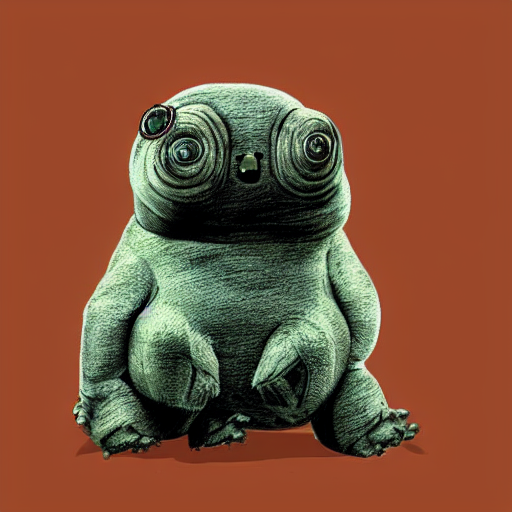

In [ ]:
#seed=32
prompt_inspirator(["a cute tardigrade"])

0it [00:00, ?it/s]

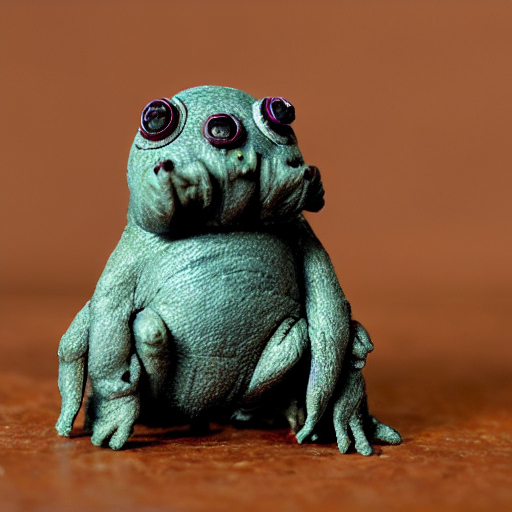

In [ ]:
#seed=32
prompt_inspirator(["a tardigrade"])

0it [00:00, ?it/s]

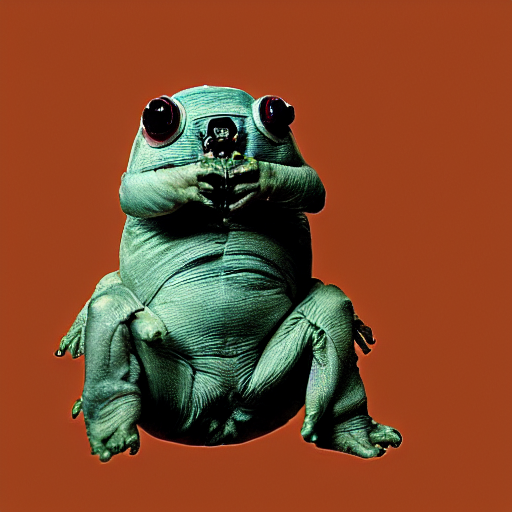

In [ ]:
#seed=32
prompt_inspirator(["body of a tardigrade"])

0it [00:00, ?it/s]

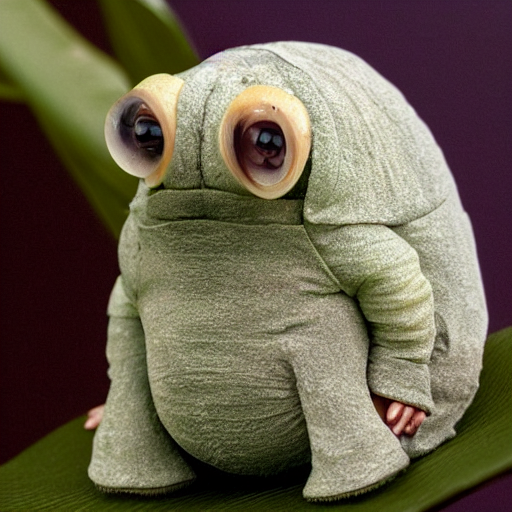

In [ ]:
#seed=0
prompt_inspirator(["a tardigrade"])

0it [00:00, ?it/s]

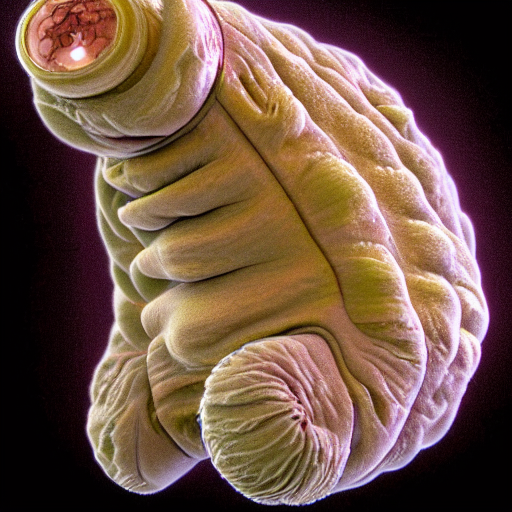

In [ ]:
prompt_inspirator(["a convoluted tardigrade, microscope view, high definition"])

0it [00:00, ?it/s]

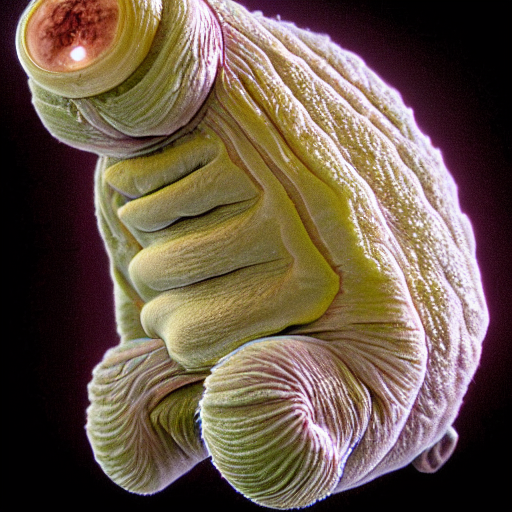

In [ ]:
prompt_inspirator(["a detailed tardigrade, microscope view, high definition"])

0it [00:00, ?it/s]

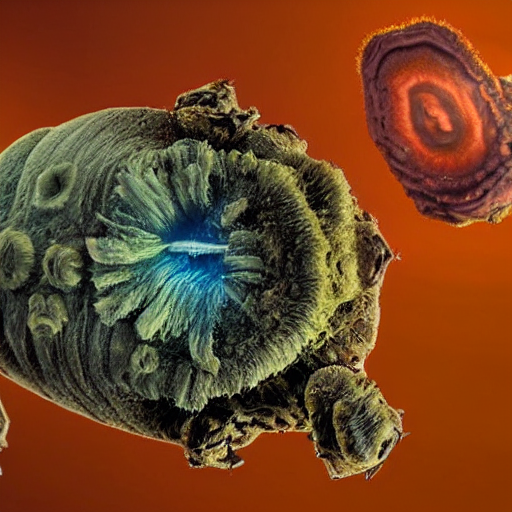

In [ ]:
#seed=32
prompt_inspirator(["a detailed tardigrade, microscope view, high definition"])

0it [00:00, ?it/s]

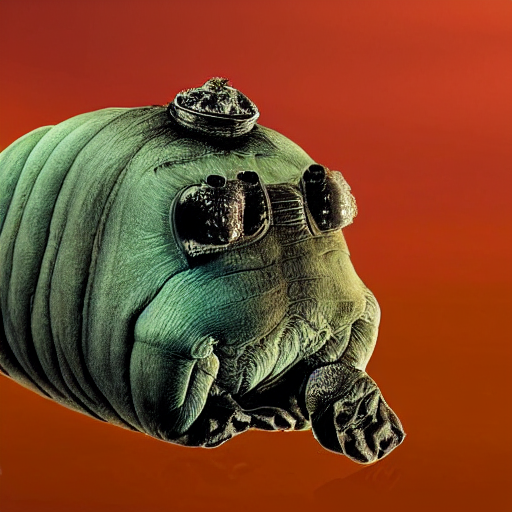

In [ ]:
#seed=32
prompt_inspirator(["a detailed tardigrade, microscopic picture, high definition"])

0it [00:00, ?it/s]

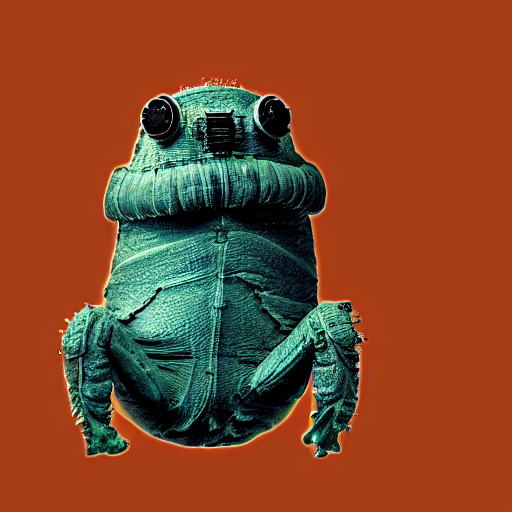

In [ ]:
#seed=32
prompt_inspirator(["a detailed microscopic picture of a tardigrade"])

0it [00:00, ?it/s]

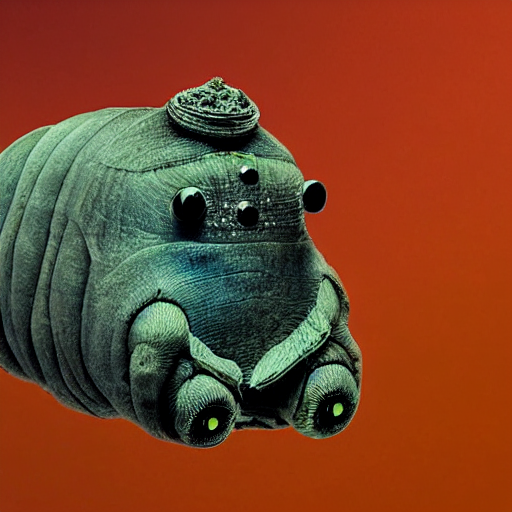

In [ ]:
#seed=32
prompt_inspirator(["a detailed microscopic image of a tardigrade, high definition"])

0it [00:00, ?it/s]

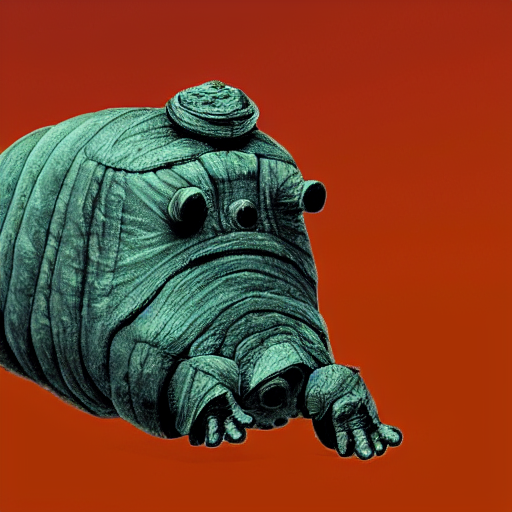

In [ ]:
#seed=32
prompt_inspirator(["a detailed microscopic image of a tardigrade, max res"])

0it [00:00, ?it/s]

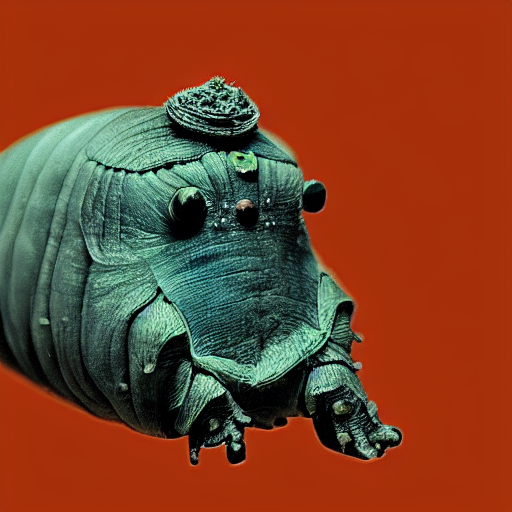

In [ ]:
#seed=32
prompt_inspirator(["a detailed microscopic picture of a tardigrade, max res"])

0it [00:00, ?it/s]

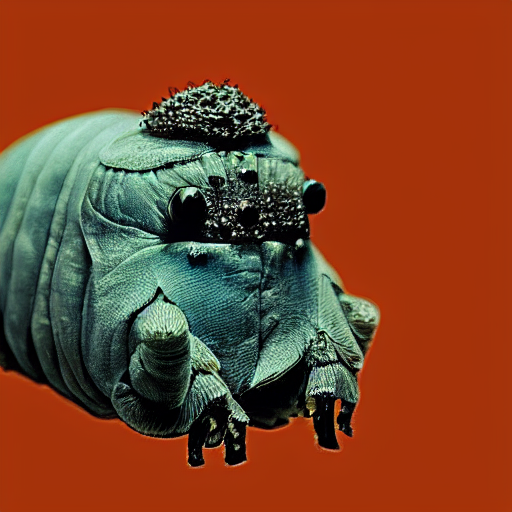

In [ ]:
#seed=32
prompt_inspirator(["a highly detailed microscopic picture of a tardigrade, max res"])

0it [00:00, ?it/s]

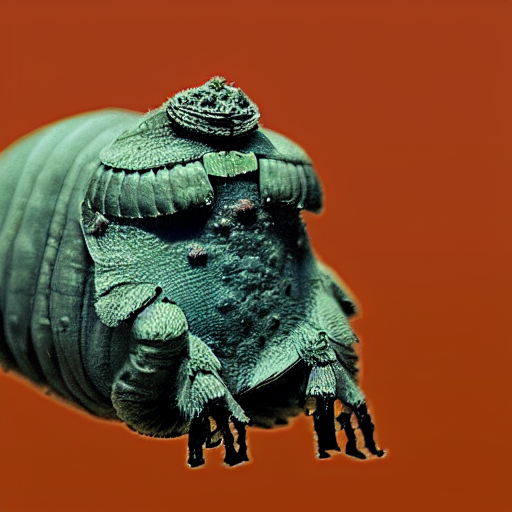

In [ ]:
#seed=32
prompt_inspirator(["a highly detailed microscopic picture of a tardigrade in its natural environment, max res"])

0it [00:00, ?it/s]

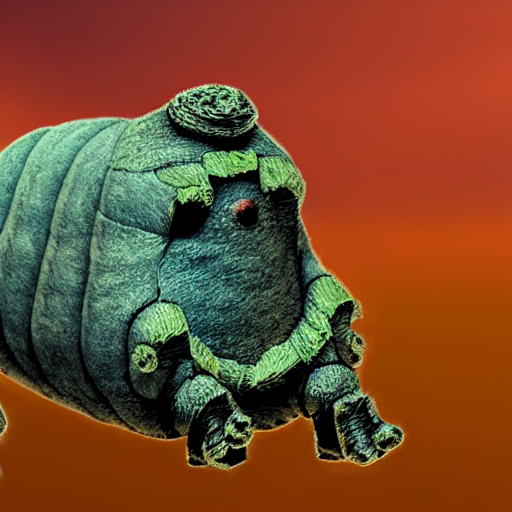

In [ ]:
#seed=32
prompt_inspirator(["a highly detailed microscopic picture of a tardigrade in a background of its natural environment, max res"])

0it [00:00, ?it/s]

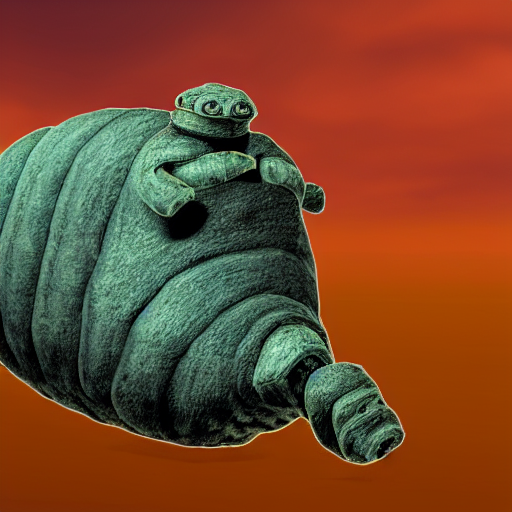

In [ ]:
#seed=32
prompt_inspirator(["a detailed microscopic picture of a tardigrade in a background of its natural environment, max res"])

0it [00:00, ?it/s]

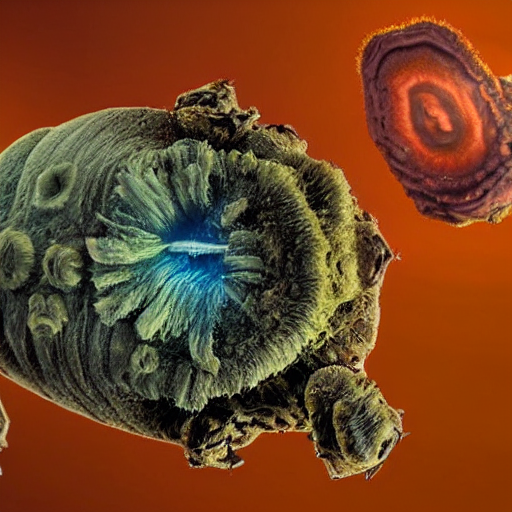

In [ ]:
#seed=32
prompt_inspirator(["a detailed tardigrade, microscope view, high definition"])

0it [00:00, ?it/s]

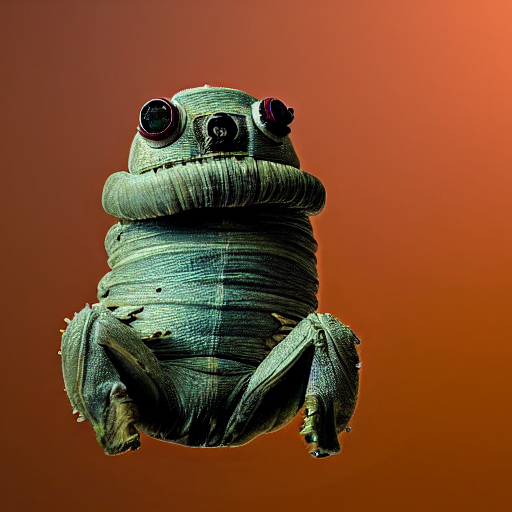

In [ ]:
#seed=32
prompt_inspirator(["a detailed tardigrade in its natural environment, microscope view, high definition"])

0it [00:00, ?it/s]

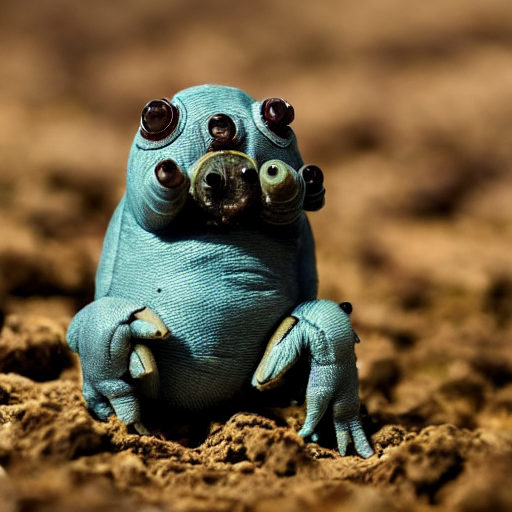

In [ ]:
#seed=32
prompt_inspirator(["a tardigrade in its natural environment"])

0it [00:00, ?it/s]

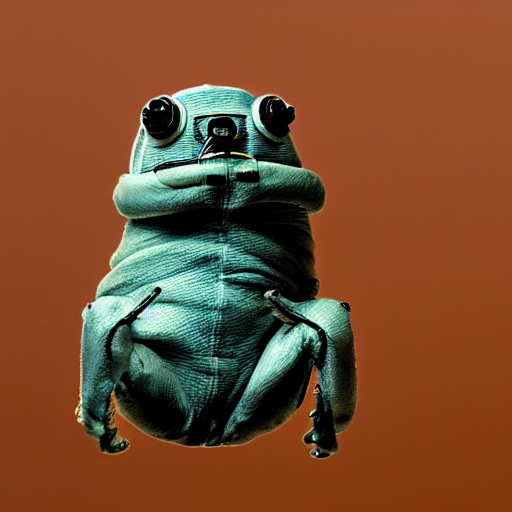

In [ ]:
#seed=32
prompt_inspirator(["a tardigrade in its natural environment, microscopic view"])

0it [00:00, ?it/s]

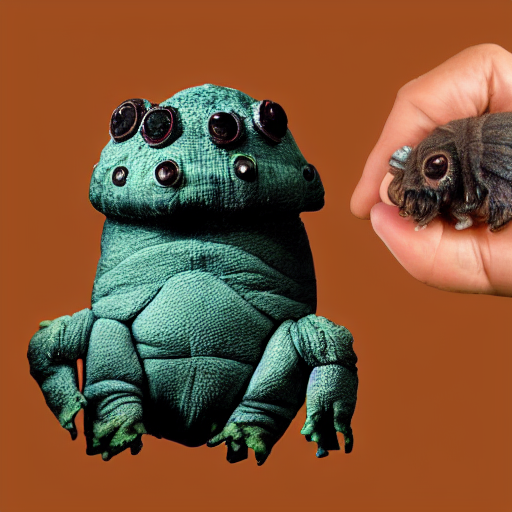

In [ ]:
#seed=32
prompt_inspirator(["a size comparison between a tardigrade and a "])